In [74]:
import pandas as pd
import os
import matplotlib.pyplot as plt

from visual_behavior import database as db
import visual_behavior.utilities as vbu
import visual_behavior.plotting as vbp
import sys

from dro.modules import plotting as plot_utils

from dro.modules import eye_tracking as et

from multiprocessing import Pool

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

import warnings
warnings.filterwarnings("ignore")

In [83]:
excluded_sessions = [
    750203572, #horribly noisy!
] #ophys IDs of sessions that should be excluded

In [2]:
%matplotlib notebook

## helper functions

In [3]:
def fix_path(path):
    if sys.platform == 'linux':
        return path.replace('\\','/')
    else:
        return path
    
def isint(string):
    try:
        int(string)
        return True
    except ValueError:
        return False

## functions for finding/extracting necessary data

In [4]:
def get_experiment_folder(experiment_id):
    folder = fix_path(r"\\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\visual_behavior_pilot_analysis\visual_behavior_pilot_manuscript_resubmission")
    for fn in os.listdir(folder):
        if isint(fn[:9]) and int(fn[:9]) == int(experiment_id):
            break
        fn = None
    if fn is not None:
        return os.path.join(folder,fn)
    

In [14]:
def get_eyetracking_timestamps(experiment_id):
    folder = get_experiment_folder(experiment_id)
    df = pd.read_hdf(os.path.join(folder,'timestamps.h5'))
    return df['behavior_monitoring'].iloc[0] #note: the 'eye_tracking' and 'behavior_monitoring' labels are swapped in this dataset

In [6]:
def get_omitted_flash_times(experiment_id):
    folder = get_experiment_folder(experiment_id)
    df = pd.read_hdf(os.path.join(folder,'stimulus_table.h5'))
    return df[df['omitted'] == True]['start_time'].values

In [8]:
def ophys_experiment_id_to_ophys_session_id(oeid):
    return db.convert_id({'ophys_experiment_id':oeid},'ophys_session_id')


In [9]:
def get_wkf_path(osid,name):
    wkf = db.get_well_known_files(osid).set_index('name')
    if name in wkf.index:
        return os.path.join(wkf.loc[name]['storage_directory'],wkf.loc[name]['filename'])
    else:
        return None

In [10]:
def event_triggered_response(df, parameter, event_times, t_before=10, t_after=10, sampling_rate=60):
    '''
    build event triggered response around a given set of events
    required inputs:
      df: dataframe of input data
      parameter: column of input dataframe to extract around events
      event_times: times of events of interest
    optional inputs:
      t_before: time before each of event of interest
      t_after: time after each event of interest
      sampling_rate: desired sampling rate of output (input data will be interpolated)
    output:
      dataframe with one time column ('t') and one column of data for each event
    '''
    if 't' in df.columns:
        time_key = 't'
    else:
        time_key = 'time'
        
    d = {time_key:np.arange(-t_before,t_after, 1/sampling_rate)}
    for ii,event_time in enumerate(np.array(event_times)):

        df_local = df.query("{0} > (@event_time - @t_before) and {0} < (@event_time + @t_after)".format(time_key))
        t = df_local[time_key] - event_time
        y = df_local[parameter]
        
        d.update({'{}'.format(ii):np.interp(d[time_key], t, y)})
    return pd.DataFrame(d)

## plotting functions

In [11]:
def convert_to_fraction(df_in):
    df = df_in.copy()
    cols = [col for col in df.columns if col not in ['t','time']]
    for col in cols:
        s = df[col]
        s0 = df[col].mean(axis=0)
        df[col] = (s - s0)/s0
    return df

In [12]:
def designate_flashes(ax,omit=None,pre_color='blue',post_color='blue'):
    '''add vertical spans to designate stimulus flashes'''
    lims = ax.get_xlim()
    for flash_start in np.arange(0,lims[1],0.75):
        if flash_start != omit:
            ax.axvspan(flash_start,flash_start+0.25,color=post_color,alpha=0.25,zorder=-np.inf)
    for flash_start in np.arange(-0.75,lims[0]-0.001,-0.75):
        if flash_start != omit:
            ax.axvspan(flash_start,flash_start+0.25,color=pre_color,alpha=0.25,zorder=-np.inf)

## open manifest

In [13]:
manifest_path = r'\\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\visual_behavior_pilot_analysis\visual_behavior_pilot_manuscript_resubmission\visual_behavior_data_manifest.csv'
manifest_path = manifest_path.replace('\\','/')

manifest = pd.read_csv(manifest_path)
manifest['ophys_session_id'] = manifest['experiment_id'].map(lambda oeid:ophys_experiment_id_to_ophys_session_id(oeid))
manifest['eye_tracking_ellipse_path'] = manifest['ophys_session_id'].map(lambda osid:get_wkf_path(osid, 'EyeTracking Ellipses'))

## open summary of sync issues

In [33]:
sync_issue_summary = pd.read_csv('//allen/programs/braintv/workgroups/nc-ophys/visual_behavior/visual_behavior_ophys_pilot_sync_line_summary.csv')
sync_issue_summary.head()

,behavior_monitoring_sync_count,behavior_movie_frames,experiment_id,eye_movie_frames,eye_tracking_sync_count,ophys_session_id,eye_matches_behavior,eye_matches_eye,eye_beh_diff
0,110394,110316,644942849,110362,110371,644919226,False,False,32
1,119306,119271,645035903,119293,119303,644953594,False,False,13
2,115876,116136,645086795,115868,116164,645055845,False,False,8
3,109152,109006,645362806,109150,109020,645326094,False,False,2
4,112515,112501,646922970,112511,112521,646846415,False,False,4


In [40]:
def has_good_sync(osid):
    return sync_issue_summary.query('ophys_session_id == @osid')['eye_matches_behavior'].iloc[0]
manifest['has_good_sync'] = manifest['ophys_session_id'].map(lambda osid:has_good_sync(osid))
manifest['has_eyetracking'] = pd.notnull(manifest['eye_tracking_ellipse_path'])

## build a new dataframe with one entry per omitted flash across all sessions

In [41]:
list_of_dicts = []
for eid in manifest['experiment_id'].values:
    eye_tracking_timestamps = get_eyetracking_timestamps(eid)
    omitted_flash_times = get_omitted_flash_times(eid)
    for ii,omitted_flash_time in enumerate(omitted_flash_times):
        list_of_dicts.append({
            'experiment_id':eid,
            'omitted_flash_time':omitted_flash_time,
        })

In [42]:
omitted_flash_table = pd.DataFrame(list_of_dicts).merge(manifest, left_on='experiment_id',right_on='experiment_id', how='left')
omitted_flash_table.sample(5)

,experiment_id,omitted_flash_time,experiment_container_id,targeted_structure,imaging_depth,cre_line,reporter_line,full_genotype,session_type,donor_id,specimen_id,experiment_date,ophys_session_id,eye_tracking_ellipse_path,has_good_sync,has_eyetracking
3060,702723649,2456.12092,700821114,VISal,175,Vip-IRES-Cre,Ai148,Vip-IRES-Cre;Ai148,behavior_session_D,363887,652073919,5/25/2018 14:51,702647224,/allen/programs/braintv/production/neuralcodin...,True,True
16998,673460976,2199.21523,673080995,VISp,175,Slc17a7-IRES2-Cre,Camk2a-tTA;Ai93,Slc17a7-IRES2-Cre;Camk2a-tTA;Ai93,behavior_session_B,355469,643316601,03/15/2018 13:34,673445687,/allen/programs/braintv/production/neuralcodin...,False,True
3146,692342909,327.19160,692315205,VISal,175,Slc17a7-IRES2-Cre,Camk2a-tTA;Ai93,Slc17a7-IRES2-Cre;Camk2a-tTA;Ai93,behavior_session_A,369320,656813113,4/30/2018 16:09,692315205,/allen/programs/braintv/production/visualbehav...,True,True
529,663773621,2463.94916,661409179,VISal,175,Slc17a7-IRES2-Cre,Camk2a-tTA;Ai93,Slc17a7-IRES2-Cre;Camk2a-tTA;Ai93,behavior_session_C,355469,643316601,2/14/2018 14:44,663754418,/allen/programs/braintv/production/neuralcodin...,True,True
16082,775011398,478.77869,774282251,VISal,175,Slc17a7-IRES2-Cre,Camk2a-tTA;Ai93,Slc17a7-IRES2-Cre;Camk2a-tTA;Ai93,behavior_session_B,409259,741940575,11/7/2018 12:01,774802383,/allen/programs/braintv/production/visualbehav...,True,True


## make an omitted flash plot for one sample session

In [43]:
session = omitted_flash_table.sample(random_state=0).iloc[0]
osid = session['ophys_session_id']
ed = vbu.EyeTrackingData(int(osid))

In [44]:
print(osid)

713171596


In [45]:
etr = event_triggered_response(ed.ellipse_fits['pupil'], 'normalized_blink_corrected_area', omitted_flash_table.query('ophys_session_id == @osid')['omitted_flash_time'].values)
etr_fractional_change = convert_to_fraction(etr)

<IPython.core.display.Javascript object>


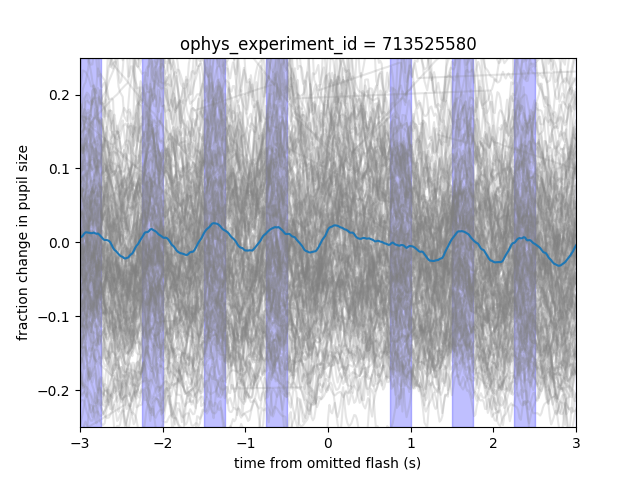

(-0.25, 0.25)

In [46]:
cols = [c for c in etr_fractional_change.columns if c != 'time']
fig,ax=plt.subplots()
for col in cols:
    ax.plot(etr_fractional_change['time'],etr_fractional_change[col],color='gray',alpha=0.2)
ax.plot(etr_fractional_change['time'],etr_fractional_change[cols].mean(axis=1))
designate_flashes(ax,omit=0)
ax.set_xlim(-3,3)
ax.set_title('ophys_experiment_id = {}'.format(session['experiment_id']))
ax.set_xlabel('time from omitted flash (s)')
ax.set_ylabel('fraction change in pupil size')
ax.set_ylim(-0.25,0.25)

<IPython.core.display.Javascript object>


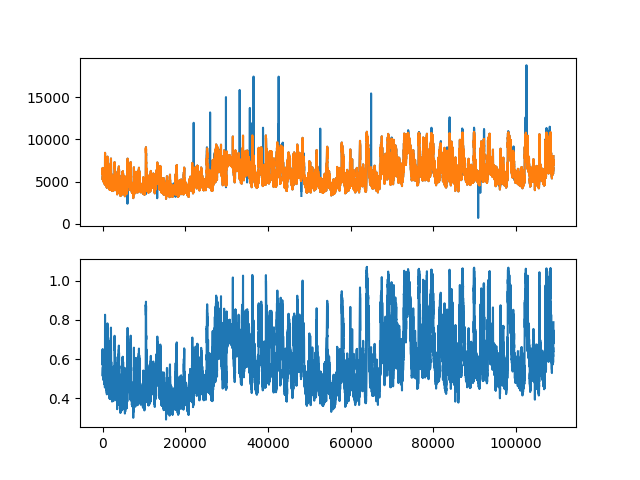

In [47]:
fig,ax=plt.subplots(2,1,sharex=True)
df = ed.ellipse_fits['pupil']
ax[0].plot(df['area'])
ax[0].plot(df['blink_corrected_area'])
ax[1].plot(df['normalized_blink_corrected_area'])

## now repeat for all sessions

In [69]:
def get_average_response(osid):
    # get eye data
    ed = vbu.EyeTrackingData(int(osid))
    
    # get event triggered response
    etr = event_triggered_response(ed.ellipse_fits['pupil'], 'normalized_blink_corrected_area', omitted_flash_table.query('ophys_session_id == @osid')['omitted_flash_time'].values)
    etr_fractional_change = convert_to_fraction(etr)

    cols = [c for c in etr_fractional_change.columns if c != 'time']
    
    df = pd.DataFrame()
    df['time'] = etr_fractional_change['time']
    df[osid] = etr_fractional_change[cols].mean(axis=1)
    
    return df

In [82]:
good_sessions.query('ophys_session_id == 750203572')

,experiment_id,omitted_flash_time,experiment_container_id,targeted_structure,imaging_depth,cre_line,reporter_line,full_genotype,session_type,donor_id,specimen_id,experiment_date,ophys_session_id,eye_tracking_ellipse_path,has_good_sync,has_eyetracking
10081,750469573,73.63682,745302137,VISal,175,Vip-IRES-Cre,Ai148,Vip-IRES-Cre;Ai148,behavior_session_C,397561,710285861,9/10/2018 11:14,750203572,/allen/programs/braintv/production/visualbehav...,True,True
10082,750469573,90.90085,745302137,VISal,175,Vip-IRES-Cre,Ai148,Vip-IRES-Cre;Ai148,behavior_session_C,397561,710285861,9/10/2018 11:14,750203572,/allen/programs/braintv/production/visualbehav...,True,True
10083,750469573,120.17476,745302137,VISal,175,Vip-IRES-Cre,Ai148,Vip-IRES-Cre;Ai148,behavior_session_C,397561,710285861,9/10/2018 11:14,750203572,/allen/programs/braintv/production/visualbehav...,True,True
10084,750469573,144.94499,745302137,VISal,175,Vip-IRES-Cre,Ai148,Vip-IRES-Cre;Ai148,behavior_session_C,397561,710285861,9/10/2018 11:14,750203572,/allen/programs/braintv/production/visualbehav...,True,True
10085,750469573,147.94747,745302137,VISal,175,Vip-IRES-Cre,Ai148,Vip-IRES-Cre;Ai148,behavior_session_C,397561,710285861,9/10/2018 11:14,750203572,/allen/programs/braintv/production/visualbehav...,True,True
10086,750469573,152.45112,745302137,VISal,175,Vip-IRES-Cre,Ai148,Vip-IRES-Cre;Ai148,behavior_session_C,397561,710285861,9/10/2018 11:14,750203572,/allen/programs/braintv/production/visualbehav...,True,True
10087,750469573,154.70299,745302137,VISal,175,Vip-IRES-Cre,Ai148,Vip-IRES-Cre;Ai148,behavior_session_C,397561,710285861,9/10/2018 11:14,750203572,/allen/programs/braintv/production/visualbehav...,True,True
10088,750469573,217.75448,745302137,VISal,175,Vip-IRES-Cre,Ai148,Vip-IRES-Cre;Ai148,behavior_session_C,397561,710285861,9/10/2018 11:14,750203572,/allen/programs/braintv/production/visualbehav...,True,True
10089,750469573,249.28024,745302137,VISal,175,Vip-IRES-Cre,Ai148,Vip-IRES-Cre;Ai148,behavior_session_C,397561,710285861,9/10/2018 11:14,750203572,/allen/programs/braintv/production/visualbehav...,True,True
10090,750469573,252.28271,745302137,VISal,175,Vip-IRES-Cre,Ai148,Vip-IRES-Cre;Ai148,behavior_session_C,397561,710285861,9/10/2018 11:14,750203572,/allen/programs/braintv/production/visualbehav...,True,True


In [84]:
good_sessions = omitted_flash_table.query('has_good_sync == True and has_eyetracking == True and ophys_session_id not in @excluded_sessions')


osids = good_sessions['ophys_session_id'].unique()
with Pool(16) as pool:
    ans = pool.map(get_average_response, osids)
    
omitted_response_averages = pd.DataFrame()
for df in ans:
    if len(omitted_response_averages) == 0:
        omitted_response_averages['time'] = df['time']
        
    osid = [c for c in df.columns if c != 'time'][0]
    omitted_response_averages[osid] = df[osid]
    


In [71]:
omitted_response_averages

,time,661514082,663754418,695444116,696112759,700821114,701164546,702013508,702647224,692315205,692805829,693265875,693827332,712038821,712636405,713171596,715027436,715537703,729705760,736204013,715858818,719860866,722894872,723643711,719538773,722884923,731666327,732665103,733351494,736893185,745611633,746727665,750203572,754850425,756565197,758180676,751189344,752754560,753612702,754401680,766725279,767197768,768653642,770935047,772503570,773411402,774145732,771235817,772126041,772613829,773419433,768053094,768780431,769382457,760666092,760891059,762166347,768145246,774282251,774802383,775329229,775876749
0,-10.000000,-0.015334,-0.011103,-0.007251,-0.006373,-0.009230,-0.010657,-0.010395,-0.008692,-0.023633,-0.034083,-0.035045,-0.021829,-0.026983,-0.020328,-0.008104,-0.021260,-0.023830,0.010087,-0.015202,-0.015438,-0.015115,-0.017798,-0.010446,0.004084,-0.001146,-0.025865,-0.018495,-0.032354,-0.016740,0.000640,0.011314,0.047711,-0.017411,-0.020466,-0.018492,-0.011857,-0.018979,-0.013363,-0.013019,-0.008121,-0.006015,-0.004802,-0.011497,-0.017127,-0.024763,-0.015613,-0.010692,-0.024228,-0.020802,-0.012236,-0.004942,-0.001679,-0.015848,-0.000633,-0.012264,-1.270531e-02,-0.016127,-0.013893,-0.004457,-0.020784,-0.029318
1,-9.983333,-0.015353,-0.010831,-0.007070,-0.006355,-0.009094,-0.010474,-0.010553,-0.008217,-0.023472,-0.034485,-0.035781,-0.022362,-0.027152,-0.020359,-0.008380,-0.021637,-0.023419,0.009434,-0.014348,-0.015468,-0.016509,-0.018193,-0.010907,0.004185,-0.002228,-0.026043,-0.018990,-0.032594,-0.016677,0.001818,0.011437,0.048577,-0.017888,-0.021230,-0.018116,-0.011748,-0.018499,-0.013558,-0.012774,-0.008190,-0.006099,-0.004844,-0.011693,-0.017318,-0.024881,-0.015617,-0.010137,-0.024455,-0.020461,-0.012675,-0.004734,-0.001840,-0.015906,-0.000861,-0.012359,-1.393481e-02,-0.016242,-0.014196,-0.004785,-0.020858,-0.030377
2,-9.966667,-0.015566,-0.010592,-0.006914,-0.006000,-0.008508,-0.010200,-0.009638,-0.007245,-0.022955,-0.034885,-0.037055,-0.023294,-0.027544,-0.019967,-0.009287,-0.021751,-0.022523,0.008426,-0.013286,-0.016365,-0.019318,-0.018892,-0.012279,0.004590,-0.005510,-0.026954,-0.020272,-0.034080,-0.017251,0.003468,0.011194,0.046787,-0.019856,-0.023224,-0.017207,-0.011798,-0.017475,-0.013514,-0.012720,-0.008242,-0.005886,-0.004336,-0.012440,-0.017476,-0.023499,-0.015847,-0.009418,-0.024819,-0.019590,-0.014199,-0.004571,-0.007726,-0.015581,-0.001249,-0.012347,-1.584437e-02,-0.016707,-0.014583,-0.005918,-0.021414,-0.032468
3,-9.950000,-0.016259,-0.009925,-0.005543,-0.004727,-0.008336,-0.009244,-0.007604,-0.006698,-0.021528,-0.033719,-0.037499,-0.021468,-0.027737,-0.019197,-0.009596,-0.021197,-0.022059,0.008673,-0.012949,-0.017818,-0.020815,-0.019821,-0.012092,0.003102,-0.008042,-0.027910,-0.021536,-0.036664,-0.018904,0.003630,0.009861,0.045263,-0.022229,-0.025208,-0.015536,-0.011762,-0.016770,-0.013540,-0.012747,-0.008022,-0.005719,-0.003771,-0.012312,-0.017345,-0.021013,-0.015569,-0.010019,-0.024653,-0.018352,-0.015214,-0.004776,-0.015386,-0.016395,-0.002503,-0.011816,-1.762973e-02,-0.016982,-0.014107,-0.007308,-0.022110,-0.033403
4,-9.933333,-0.016980,-0.008562,-0.003622,-0.003502,-0.008261,-0.007697,-0.005221,-0.006697,-0.019769,-0.031631,-0.037299,-0.019727,-0.027300,-0.017596,-0.009482,-0.020541,-0.021923,0.009373,-0.013241,-0.018063,-0.019736,-0.020793,-0.012472,0.000622,-0.007838,-0.026937,-0.022192,-0.038904,-0.019910,0.002267,0.007893,0.049837,-0.024110,-0.026078,-0.013529,-0.011089,-0.015809,-0.012915,-0.012029,-0.008189,-0.005931,-0.003837,-0.012260,-0.018318,-0.020174,-0.014955,-0.010384,-0.023320,-0.017313,-0.014552,-0.004860,-0.018898,-0.017815,-0.003221,-0.011665,-1.759236e-02,-0.017627,-0.012851,-0.007248,-0.022519,-0.032205
5,-9.916667,-0.016535,-0.007821,-0.002715,-0.002518,-0.006664,-0.006234,-0.002913,-0.005933,-0.018012,-0.029459,-0.036049,-0.019906,-0.026860,-0.015795,-0.008565,-0.019924,-0.020580,0.010104,-0.013431,-0.017928,-0.018259,-0.021360,-0.014813,-0.000795,-0.006221,-0.025361,-0.0219

<IPython.core.display.Javascript object>


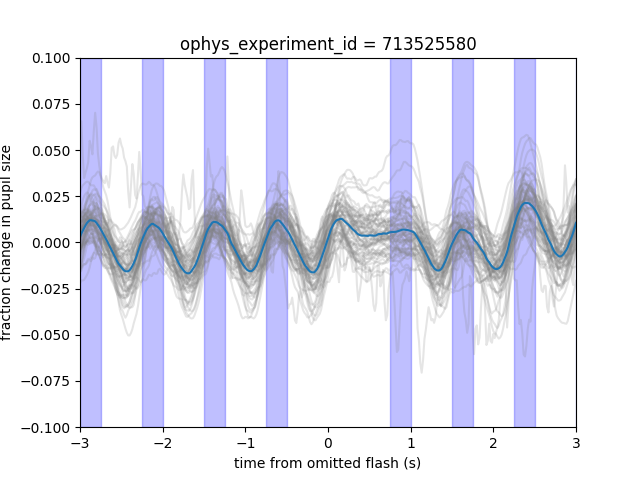

(-0.1, 0.1)

In [79]:
cols = [c for c in omitted_response_averages.columns if c != 'time']
fig,ax=plt.subplots()
for col in cols:
    ax.plot(omitted_response_averages['time'],omitted_response_averages[col],color='gray',alpha=0.2)
ax.plot(omitted_response_averages['time'],omitted_response_averages[cols].mean(axis=1))
designate_flashes(ax,omit=0)
ax.set_xlim(-3,3)
ax.set_title('ophys_experiment_id = {}'.format(session['experiment_id']))
ax.set_xlabel('time from omitted flash (s)')
ax.set_ylabel('fraction change in pupil size')
ax.set_ylim(-0.1,0.1)

In [78]:
plot_utils.plotly_event_triggered_response_plot(
    omitted_response_averages,
    x_value='time',
    y_values=[c for c in omitted_response_averages.columns if c != 'time'],
    var_name='ophys_session_id'
)
